In [1]:
#Import important libraries
import warnings
warnings.filterwarnings('ignore')

import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
%matplotlib inline
sns.set(color_codes=True)

import os as os
import sklearn
from sklearn.linear_model import LinearRegression
from sklearn.metrics import mean_squared_error,mean_absolute_error
from sklearn.model_selection import train_test_split
from sklearn.metrics import roc_auc_score,roc_curve
import statsmodels.api as sm



## IMPORTING DATA

In [2]:
data=pd.read_excel(r"C:\Users\Akash Jha\OneDrive\Desktop\Education Data Science\Great Learning\Great Learning Predective\Week 1 Linear Regression\compactiv.xlsx")

## EDA 

In [3]:
data.head()

,lread,lwrite,scall,sread,swrite,fork,exec,rchar,wchar,pgout,...,pgscan,atch,pgin,ppgin,pflt,vflt,runqsz,freemem,freeswap,usr
0,1,0,2147,79,68,0.2,0.2,40671.0,53995.0,0.0,...,0.0,0.0,1.6,2.6,16.00,26.40,CPU_Bound,4670,1730946,95
1,0,0,170,18,21,0.2,0.2,448.0,8385.0,0.0,...,0.0,0.0,0.0,0.0,15.63,16.83,Not_CPU_Bound,7278,1869002,97
2,15,3,2162,159,119,2.0,2.4,NaN,31950.0,0.0,...,0.0,1.2,6.0,9.4,150.20,220.20,Not_CPU_Bound,702,1021237,87
3,0,0,160,12,16,0.2,0.2,NaN,8670.0,0.0,...,0.0,0.0,0.2,0.2,15.60,16.80,Not_CPU_Bound,7248,1863704,98
4,5,1,330,39,38,0.4,0.4,NaN,12185.0,0.0,...,0.0,0.0,1.0,1.2,37.80,47.60,Not_CPU_Bound,633,1760253,90


In [4]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8192 entries, 0 to 8191
Data columns (total 22 columns):
 #   Column    Non-Null Count  Dtype  
---  ------    --------------  -----  
 0   lread     8192 non-null   int64  
 1   lwrite    8192 non-null   int64  
 2   scall     8192 non-null   int64  
 3   sread     8192 non-null   int64  
 4   swrite    8192 non-null   int64  
 5   fork      8192 non-null   float64
 6   exec      8192 non-null   float64
 7   rchar     8088 non-null   float64
 8   wchar     8177 non-null   float64
 9   pgout     8192 non-null   float64
 10  ppgout    8192 non-null   float64
 11  pgfree    8192 non-null   float64
 12  pgscan    8192 non-null   float64
 13  atch      8192 non-null   float64
 14  pgin      8192 non-null   float64
 15  ppgin     8192 non-null   float64
 16  pflt      8192 non-null   float64
 17  vflt      8192 non-null   float64
 18  runqsz    8192 non-null   object 
 19  freemem   8192 non-null   int64  
 20  freeswap  8192 non-null   int6

In [5]:
data.describe(include='all').T

,count,unique,top,freq,mean,std,min,25%,50%,75%,max
lread,8192.0,NaN,NaN,NaN,19.559692,53.353799,0.0,2.0,7.0,20.0,1845.0
lwrite,8192.0,NaN,NaN,NaN,13.106201,29.891726,0.0,0.0,1.0,10.0,575.0
scall,8192.0,NaN,NaN,NaN,2306.318237,1633.617322,109.0,1012.0,2051.5,3317.25,12493.0
sread,8192.0,NaN,NaN,NaN,210.47998,198.980146,6.0,86.0,166.0,279.0,5318.0
swrite,8192.0,NaN,NaN,NaN,150.058228,160.47898,7.0,63.0,117.0,185.0,5456.0
fork,8192.0,NaN,NaN,NaN,1.884554,2.479493,0.0,0.4,0.8,2.2,20.12
exec,8192.0,NaN,NaN,NaN,2.791998,5.212456,0.0,0.2,1.2,2.8,59.56
rchar,8088.0,NaN,NaN,NaN,197385.728363,239837.493526,278.0,34091.5,125473.5,267828.75,2526649.0
wchar,8177.0,NaN,NaN,NaN,95902.992785,140841.707911,1498.0,22916.0,46619.0,106101.0,1801623.0
pgout,8192.0,NaN,NaN,NaN,2.285317,5.307038,0.0,0.0,0.0,2.4,81.44


In [6]:
data['runqsz'].unique()

array(['CPU_Bound', 'Not_CPU_Bound'], dtype=object)

In [7]:
for column in data.columns:
    if data[column].dtype=='object':
        print(column.upper(),':',data[column].unique())
        print(data[column].value_counts(1))
        print('\n')

RUNQSZ : ['CPU_Bound' 'Not_CPU_Bound']
Not_CPU_Bound    0.528687
CPU_Bound        0.471313
Name: runqsz, dtype: float64




## Imputing missing Values by mean of whole column

In [8]:
for column in data.columns:
    if data[column].dtype!='object':
        mean=data[column].mean()
        data[column]=data[column].fillna(mean)
        
data.isna().sum()

lread       0
lwrite      0
scall       0
sread       0
swrite      0
fork        0
exec        0
rchar       0
wchar       0
pgout       0
ppgout      0
pgfree      0
pgscan      0
atch        0
pgin        0
ppgin       0
pflt        0
vflt        0
runqsz      0
freemem     0
freeswap    0
usr         0
dtype: int64

## Checking for duplicates

In [9]:
dups= data.duplicated()
print('No of duplicates rows=%d'% (dups.sum()))

No of duplicates rows=0


# Creating Dummy Variables for Category

In [10]:
data= pd.get_dummies(data,columns=['runqsz'],drop_first=True)

In [11]:
data.head()

,lread,lwrite,scall,sread,swrite,fork,exec,rchar,wchar,pgout,...,pgscan,atch,pgin,ppgin,pflt,vflt,freemem,freeswap,usr,runqsz_Not_CPU_Bound
0,1,0,2147,79,68,0.2,0.2,40671.000000,53995.0,0.0,...,0.0,0.0,1.6,2.6,16.00,26.40,4670,1730946,95,0
1,0,0,170,18,21,0.2,0.2,448.000000,8385.0,0.0,...,0.0,0.0,0.0,0.0,15.63,16.83,7278,1869002,97,1
2,15,3,2162,159,119,2.0,2.4,197385.728363,31950.0,0.0,...,0.0,1.2,6.0,9.4,150.20,220.20,702,1021237,87,1
3,0,0,160,12,16,0.2,0.2,197385.728363,8670.0,0.0,...,0.0,0.0,0.2,0.2,15.60,16.80,7248,1863704,98,1
4,5,1,330,39,38,0.4,0.4,197385.728363,12185.0,0.0,...,0.0,0.0,1.0,1.2,37.80,47.60,633,1760253,90,1


# Checking Correlation

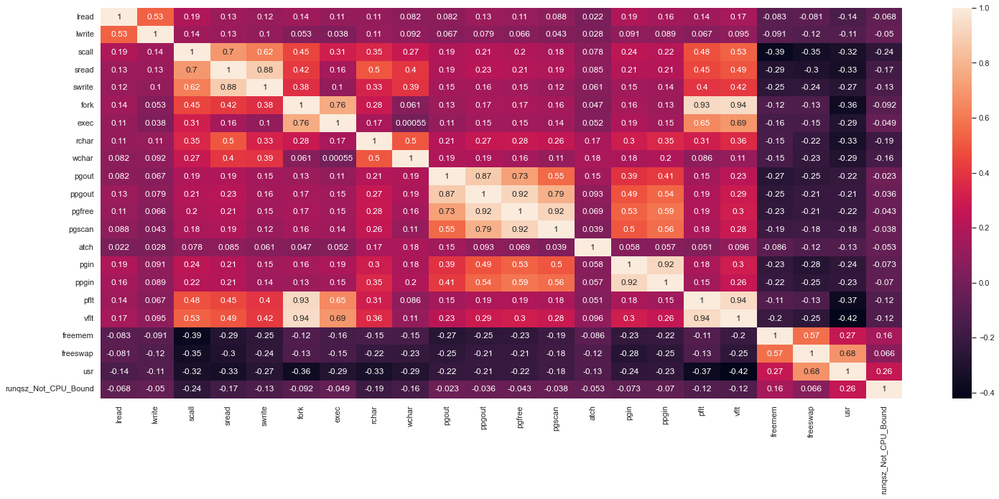

In [12]:
plt.figure(figsize=(25,10))
sns.heatmap(data.corr(),annot=True)
plt.show()

## DATA CLEANING

In [13]:
data.head()

,lread,lwrite,scall,sread,swrite,fork,exec,rchar,wchar,pgout,...,pgscan,atch,pgin,ppgin,pflt,vflt,freemem,freeswap,usr,runqsz_Not_CPU_Bound
0,1,0,2147,79,68,0.2,0.2,40671.000000,53995.0,0.0,...,0.0,0.0,1.6,2.6,16.00,26.40,4670,1730946,95,0
1,0,0,170,18,21,0.2,0.2,448.000000,8385.0,0.0,...,0.0,0.0,0.0,0.0,15.63,16.83,7278,1869002,97,1
2,15,3,2162,159,119,2.0,2.4,197385.728363,31950.0,0.0,...,0.0,1.2,6.0,9.4,150.20,220.20,702,1021237,87,1
3,0,0,160,12,16,0.2,0.2,197385.728363,8670.0,0.0,...,0.0,0.0,0.2,0.2,15.60,16.80,7248,1863704,98,1
4,5,1,330,39,38,0.4,0.4,197385.728363,12185.0,0.0,...,0.0,0.0,1.0,1.2,37.80,47.60,633,1760253,90,1


# Check for Outliers

# Impute 0 in Usr column

In [14]:
data['usr']=data['usr'].replace({0:np.nan})
data['usr'].fillna(data['usr'].median(),inplace=True)

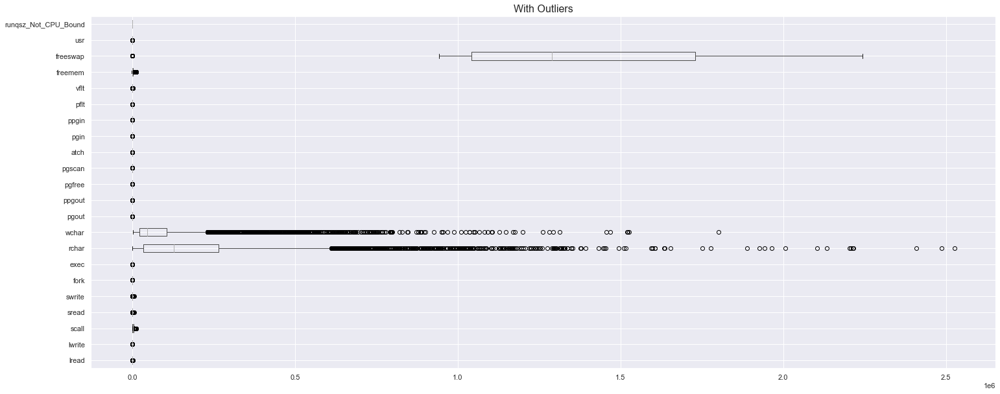

In [15]:
plt.figure(figsize=(25,10))
data.boxplot(vert=0)
plt.title('With Outliers',fontsize=16)
plt.show()

In [16]:
data.columns

Index(['lread', 'lwrite', 'scall', 'sread', 'swrite', 'fork', 'exec', 'rchar',
       'wchar', 'pgout', 'ppgout', 'pgfree', 'pgscan', 'atch', 'pgin', 'ppgin',
       'pflt', 'vflt', 'freemem', 'freeswap', 'usr', 'runqsz_Not_CPU_Bound'],
      dtype='object')

In [17]:
cols=['lread', 'lwrite', 'scall', 'sread', 'swrite', 'fork', 'exec', 'rchar',
       'wchar', 'pgout', 'ppgout', 'pgfree', 'pgscan', 'atch', 'pgin', 'ppgin',
       'pflt', 'vflt', 'freemem', 'freeswap', 'usr']

In [18]:
def remove_outliers(col):
    sorted (col)
    Q1,Q3=np.percentile(col,[25,75])
    IQR=Q3-Q1
    lower_range=Q1-(1.5*IQR)
    upper_range=Q3+(1.5*IQR)
    return lower_range,upper_range

In [19]:
for column in data[cols].columns:
    lr,ur=remove_outliers(data[column])
    data[column]=np.where(data[column]>ur,ur,data[column])
    data[column]=np.where(data[column]<lr,lr,data[column])
    
    

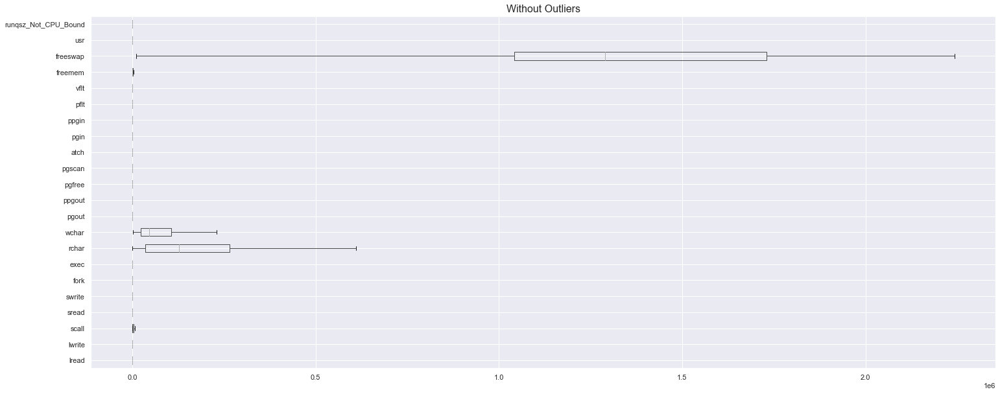

In [20]:
plt.figure(figsize=(25,10))
data.boxplot(vert=0)
plt.title('Without Outliers',fontsize=16)
plt.show()

# Data Distribution

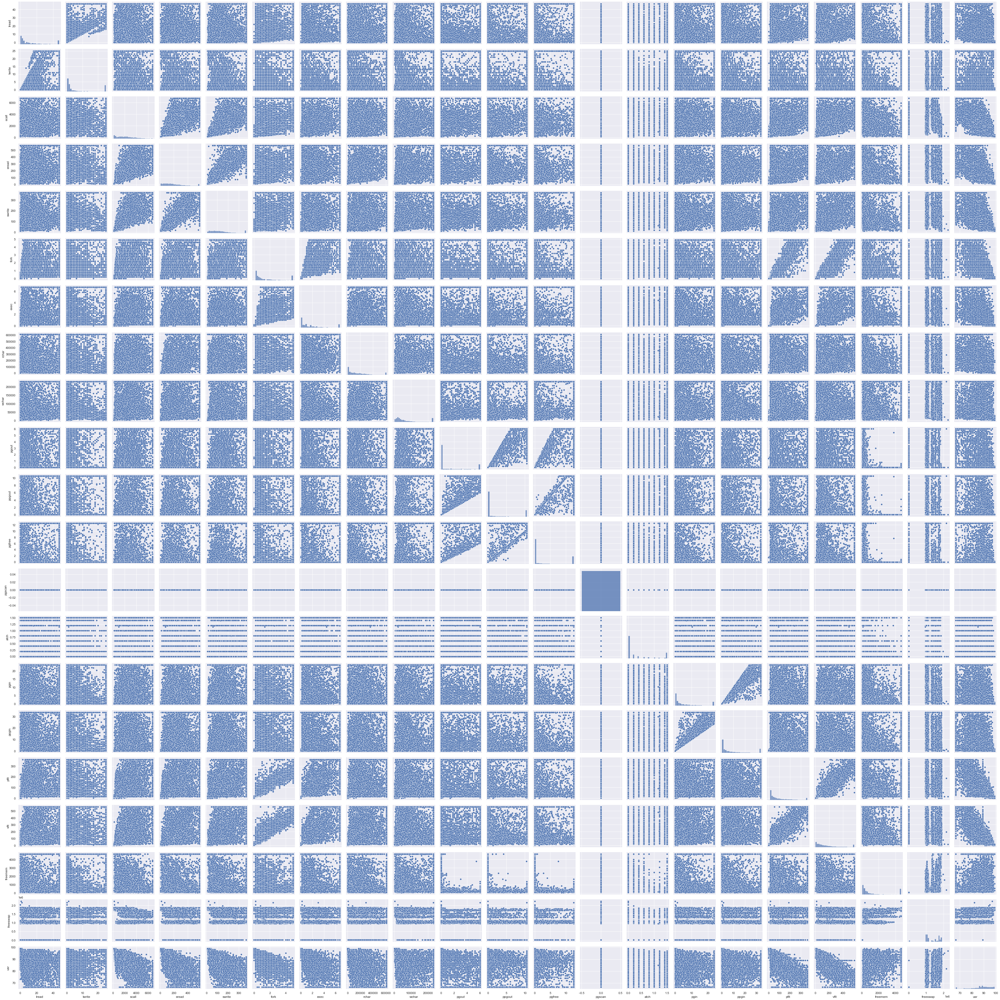

In [22]:
data_attr= data[cols]
fig=sns.pairplot(data_attr)
plt.show()
fig.savefig("out.png")

# Univariate Analysis

In [23]:
def univariateAnalysis(column,nbins):
    print ('Description of '+ column)
    print('-------------------------')
    print(data[column].describe(),end='')
    
    plt.figure()
    print('Distribution of '+ column)
    print('--------------------------')
    sns.displot(data[column],kde=False,color='g')
    
    plt.figure()
    print('Boxplot of '+ column)
    print('--------------------------')
    ax=sns.boxplot(x=data[column])
    plt.show()
    

Description of usr
-------------------------
count    8192.000000
mean       87.329468
std         8.192146
min        66.500000
25%        83.000000
50%        89.000000
75%        94.000000
max        99.000000
Name: usr, dtype: float64Distribution of usr
--------------------------
Boxplot of usr
--------------------------


<Figure size 432x288 with 0 Axes>

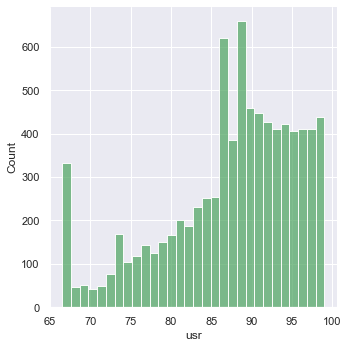

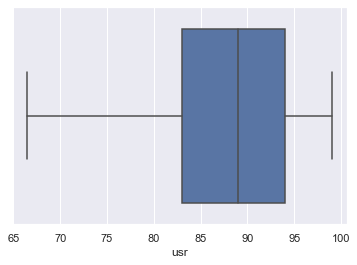

In [24]:
univariateAnalysis('usr',20)

In [25]:
lstnumeric=list(data.columns.values)
len(lstnumeric)

22

Description of lread
-------------------------
count    8192.000000
mean       13.422852
std        15.159741
min         0.000000
25%         2.000000
50%         7.000000
75%        20.000000
max        47.000000
Name: lread, dtype: float64Distribution of lread
--------------------------
Boxplot of lread
--------------------------


<Figure size 432x288 with 0 Axes>

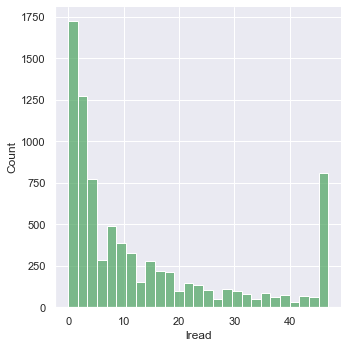

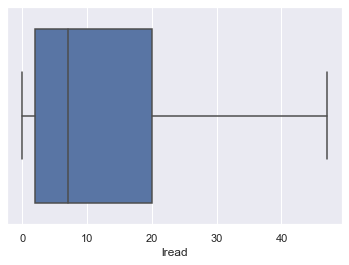

<Figure size 432x288 with 0 Axes>

Description of lwrite
-------------------------
count    8192.000000
mean        6.657471
std         9.291945
min         0.000000
25%         0.000000
50%         1.000000
75%        10.000000
max        25.000000
Name: lwrite, dtype: float64Distribution of lwrite
--------------------------
Boxplot of lwrite
--------------------------


<Figure size 432x288 with 0 Axes>

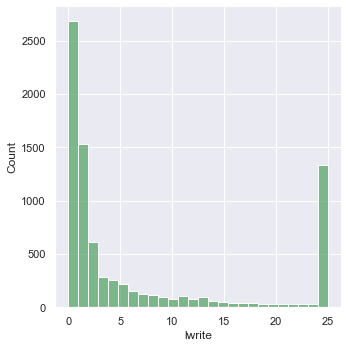

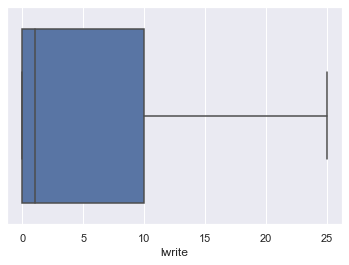

<Figure size 432x288 with 0 Axes>

Description of scall
-------------------------
count    8192.000000
mean     2294.483582
std      1593.093446
min       109.000000
25%      1012.000000
50%      2051.500000
75%      3317.250000
max      6775.125000
Name: scall, dtype: float64Distribution of scall
--------------------------
Boxplot of scall
--------------------------


<Figure size 432x288 with 0 Axes>

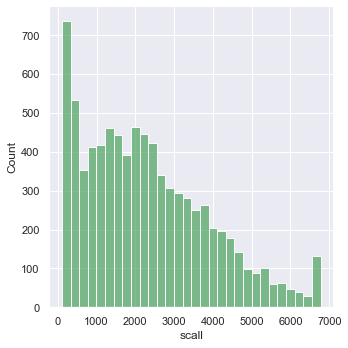

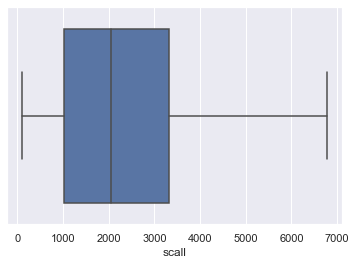

<Figure size 432x288 with 0 Axes>

Description of sread
-------------------------
count    8192.000000
mean      199.776367
std       146.758932
min         6.000000
25%        86.000000
50%       166.000000
75%       279.000000
max       568.500000
Name: sread, dtype: float64Distribution of sread
--------------------------
Boxplot of sread
--------------------------


<Figure size 432x288 with 0 Axes>

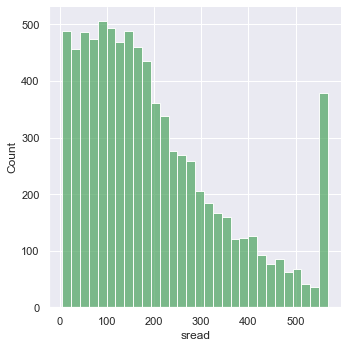

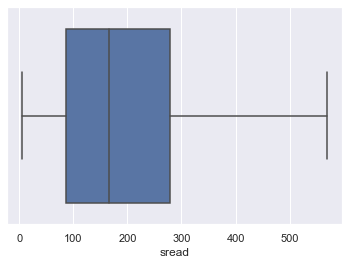

<Figure size 432x288 with 0 Axes>

Description of swrite
-------------------------
count    8192.000000
mean      137.969971
std        97.141835
min         7.000000
25%        63.000000
50%       117.000000
75%       185.000000
max       368.000000
Name: swrite, dtype: float64Distribution of swrite
--------------------------
Boxplot of swrite
--------------------------


<Figure size 432x288 with 0 Axes>

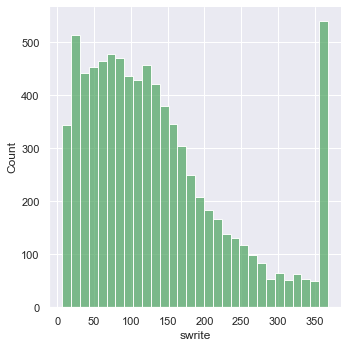

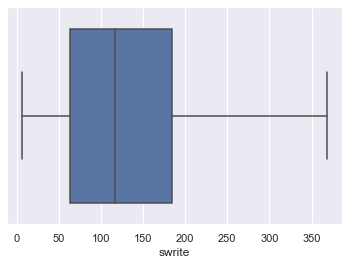

<Figure size 432x288 with 0 Axes>

Description of fork
-------------------------
count    8192.000000
mean        1.557771
std         1.591220
min         0.000000
25%         0.400000
50%         0.800000
75%         2.200000
max         4.900000
Name: fork, dtype: float64Distribution of fork
--------------------------
Boxplot of fork
--------------------------


<Figure size 432x288 with 0 Axes>

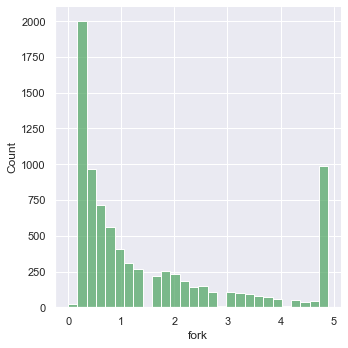

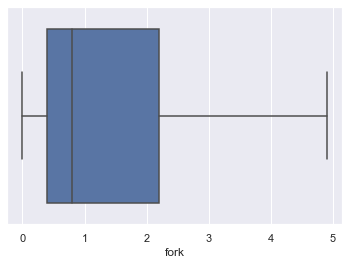

<Figure size 432x288 with 0 Axes>

Description of exec
-------------------------
count    8192.000000
mean        1.931495
std         2.028253
min         0.000000
25%         0.200000
50%         1.200000
75%         2.800000
max         6.700000
Name: exec, dtype: float64Distribution of exec
--------------------------
Boxplot of exec
--------------------------


<Figure size 432x288 with 0 Axes>

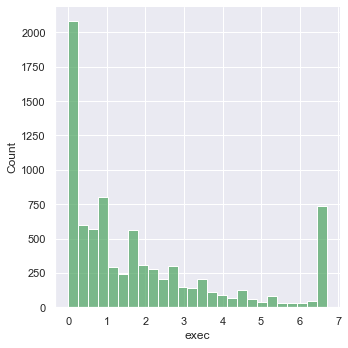

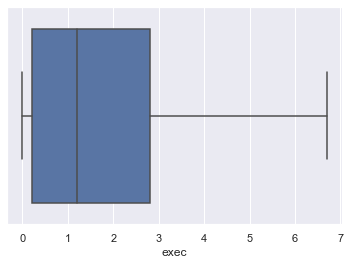

<Figure size 432x288 with 0 Axes>

Description of rchar
-------------------------
count      8192.000000
mean     179797.020981
std      174495.517891
min         278.000000
25%       34860.500000
50%      127825.000000
75%      265394.750000
max      611196.125000
Name: rchar, dtype: float64Distribution of rchar
--------------------------
Boxplot of rchar
--------------------------


<Figure size 432x288 with 0 Axes>

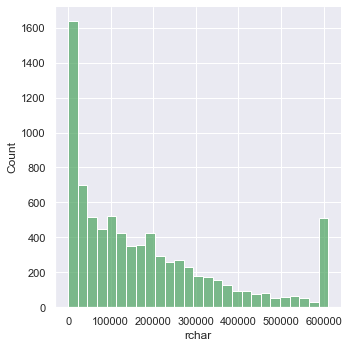

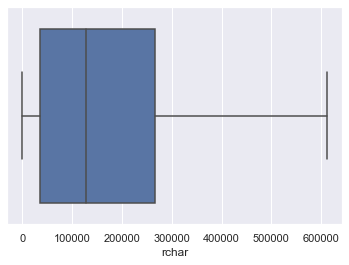

<Figure size 432x288 with 0 Axes>

Description of wchar
-------------------------
count      8192.000000
mean      75735.782564
std       71257.347749
min        1498.000000
25%       22977.750000
50%       46653.000000
75%      106037.000000
max      230625.875000
Name: wchar, dtype: float64Distribution of wchar
--------------------------
Boxplot of wchar
--------------------------


<Figure size 432x288 with 0 Axes>

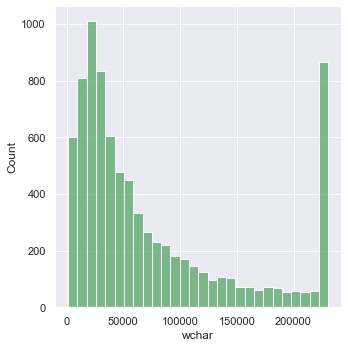

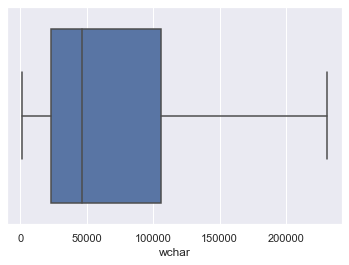

<Figure size 432x288 with 0 Axes>

Description of pgout
-------------------------
count    8192.000000
mean        1.420901
std         2.200251
min         0.000000
25%         0.000000
50%         0.000000
75%         2.400000
max         6.000000
Name: pgout, dtype: float64Distribution of pgout
--------------------------
Boxplot of pgout
--------------------------


<Figure size 432x288 with 0 Axes>

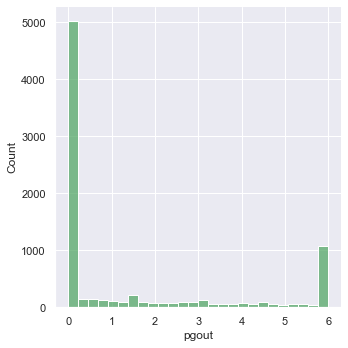

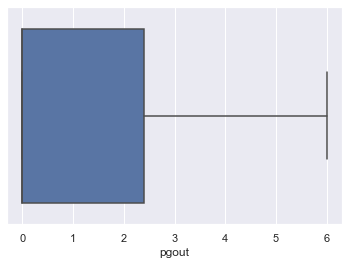

<Figure size 432x288 with 0 Axes>

Description of ppgout
-------------------------
count    8192.000000
mean        2.560702
std         4.037317
min         0.000000
25%         0.000000
50%         0.000000
75%         4.200000
max        10.500000
Name: ppgout, dtype: float64Distribution of ppgout
--------------------------
Boxplot of ppgout
--------------------------


<Figure size 432x288 with 0 Axes>

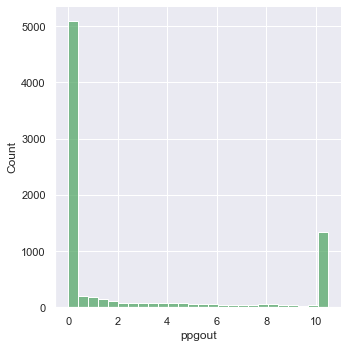

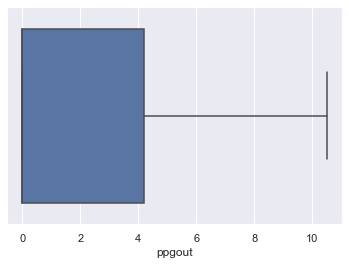

<Figure size 432x288 with 0 Axes>

Description of pgfree
-------------------------
count    8192.000000
mean        3.164586
std         4.983345
min         0.000000
25%         0.000000
50%         0.000000
75%         5.000000
max        12.500000
Name: pgfree, dtype: float64Distribution of pgfree
--------------------------
Boxplot of pgfree
--------------------------


<Figure size 432x288 with 0 Axes>

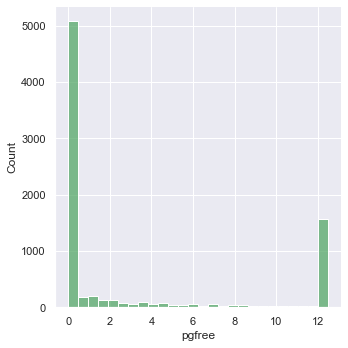

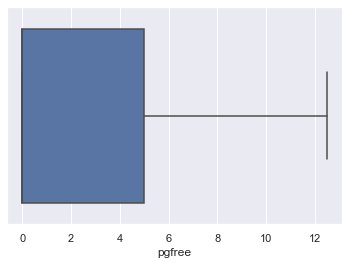

<Figure size 432x288 with 0 Axes>

Description of pgscan
-------------------------
count    8192.0
mean        0.0
std         0.0
min         0.0
25%         0.0
50%         0.0
75%         0.0
max         0.0
Name: pgscan, dtype: float64Distribution of pgscan
--------------------------
Boxplot of pgscan
--------------------------


<Figure size 432x288 with 0 Axes>

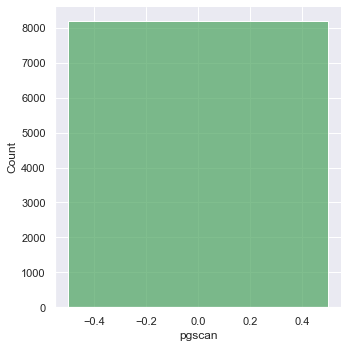

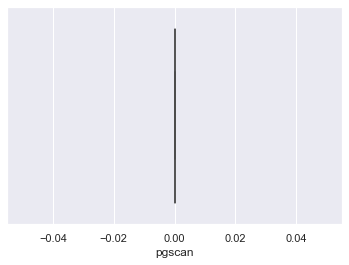

<Figure size 432x288 with 0 Axes>

Description of atch
-------------------------
count    8192.000000
mean        0.388279
std         0.562937
min         0.000000
25%         0.000000
50%         0.000000
75%         0.600000
max         1.500000
Name: atch, dtype: float64Distribution of atch
--------------------------
Boxplot of atch
--------------------------


<Figure size 432x288 with 0 Axes>

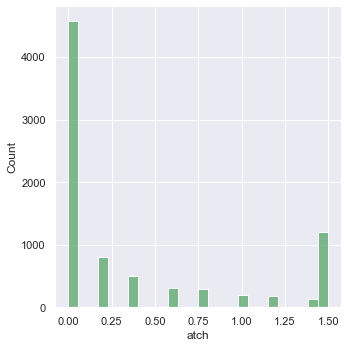

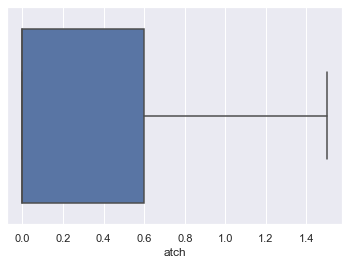

<Figure size 432x288 with 0 Axes>

Description of pgin
-------------------------
count    8192.000000
mean        6.385262
std         7.684420
min         0.000000
25%         0.600000
50%         2.800000
75%         9.765000
max        23.512500
Name: pgin, dtype: float64Distribution of pgin
--------------------------
Boxplot of pgin
--------------------------


<Figure size 432x288 with 0 Axes>

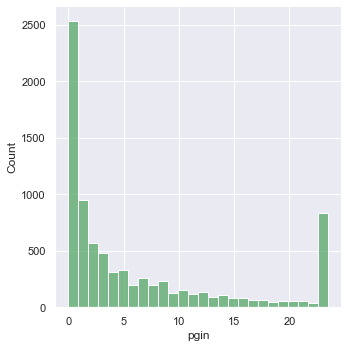

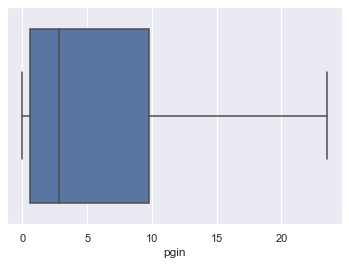

<Figure size 432x288 with 0 Axes>

Description of ppgin
-------------------------
count    8192.000000
mean        9.140437
std        11.160927
min         0.000000
25%         0.600000
50%         3.800000
75%        13.800000
max        33.600000
Name: ppgin, dtype: float64Distribution of ppgin
--------------------------
Boxplot of ppgin
--------------------------


<Figure size 432x288 with 0 Axes>

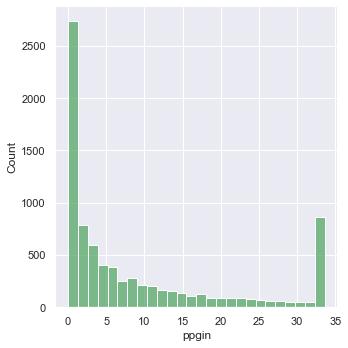

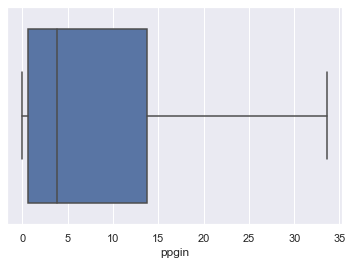

<Figure size 432x288 with 0 Axes>

Description of pflt
-------------------------
count    8192.000000
mean      105.636071
std       101.548788
min         0.000000
25%        25.000000
50%        63.800000
75%       159.600000
max       361.500000
Name: pflt, dtype: float64Distribution of pflt
--------------------------
Boxplot of pflt
--------------------------


<Figure size 432x288 with 0 Axes>

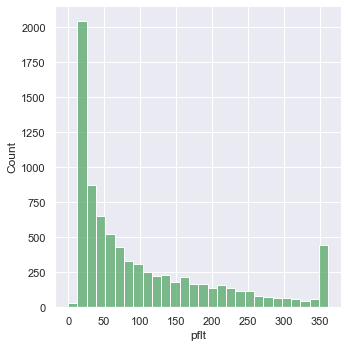

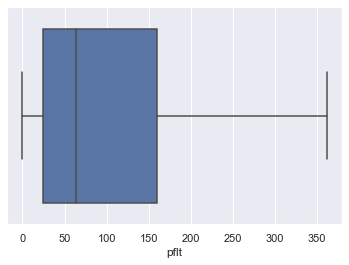

<Figure size 432x288 with 0 Axes>

Description of vflt
-------------------------
count    8192.000000
mean      175.622458
std       162.497031
min         0.200000
25%        45.400000
50%       120.400000
75%       251.800000
max       561.400000
Name: vflt, dtype: float64Distribution of vflt
--------------------------
Boxplot of vflt
--------------------------


<Figure size 432x288 with 0 Axes>

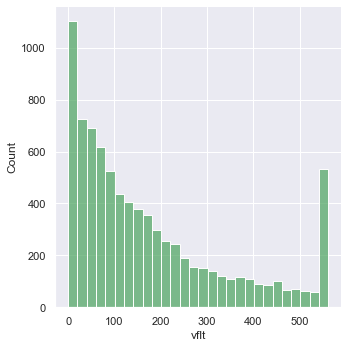

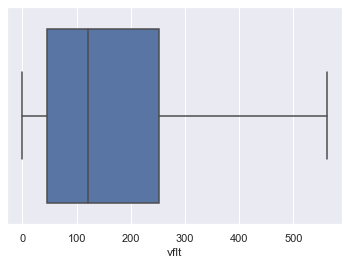

<Figure size 432x288 with 0 Axes>

Description of freemem
-------------------------
count    8192.000000
mean     1387.624527
std      1605.763418
min        55.000000
25%       231.000000
50%       579.000000
75%      2002.250000
max      4659.125000
Name: freemem, dtype: float64Distribution of freemem
--------------------------
Boxplot of freemem
--------------------------


<Figure size 432x288 with 0 Axes>

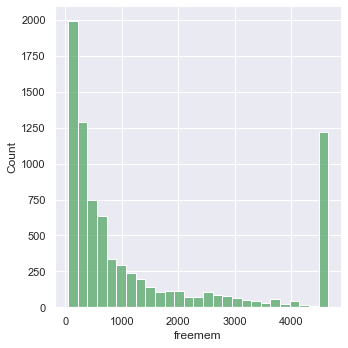

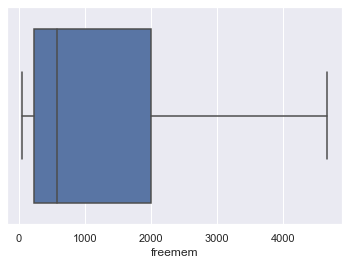

<Figure size 432x288 with 0 Axes>

Description of freeswap
-------------------------
count    8.192000e+03
mean     1.328520e+06
std      4.207827e+05
min      1.098950e+04
25%      1.042624e+06
50%      1.289290e+06
75%      1.730380e+06
max      2.243187e+06
Name: freeswap, dtype: float64Distribution of freeswap
--------------------------
Boxplot of freeswap
--------------------------


<Figure size 432x288 with 0 Axes>

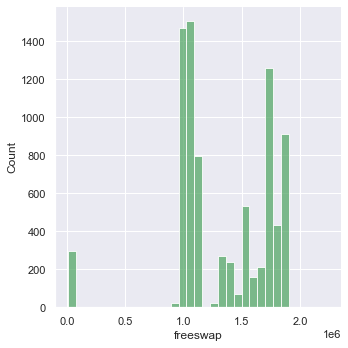

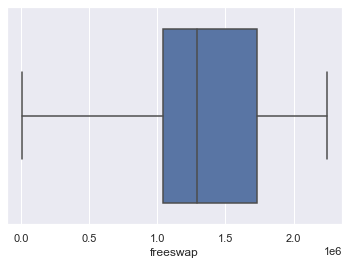

<Figure size 432x288 with 0 Axes>

Description of usr
-------------------------
count    8192.000000
mean       87.329468
std         8.192146
min        66.500000
25%        83.000000
50%        89.000000
75%        94.000000
max        99.000000
Name: usr, dtype: float64Distribution of usr
--------------------------
Boxplot of usr
--------------------------


<Figure size 432x288 with 0 Axes>

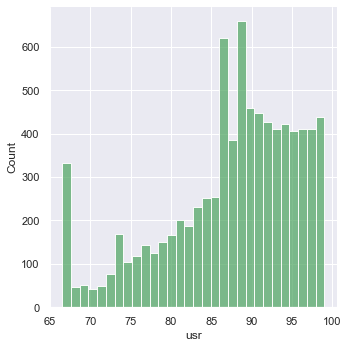

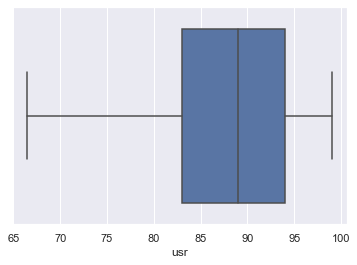

<Figure size 432x288 with 0 Axes>

Description of runqsz_Not_CPU_Bound
-------------------------
count    8192.000000
mean        0.528687
std         0.499207
min         0.000000
25%         0.000000
50%         1.000000
75%         1.000000
max         1.000000
Name: runqsz_Not_CPU_Bound, dtype: float64Distribution of runqsz_Not_CPU_Bound
--------------------------
Boxplot of runqsz_Not_CPU_Bound
--------------------------


<Figure size 432x288 with 0 Axes>

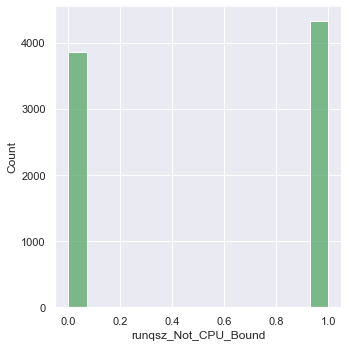

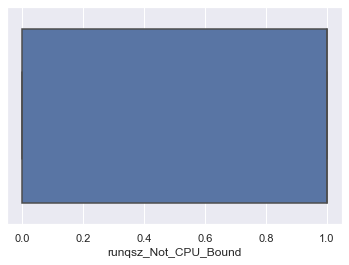

<Figure size 432x288 with 0 Axes>

In [26]:
for x in lstnumeric:
    univariateAnalysis(x,20)
    plt.savefig(str(x)+'boxplot.jpg')
    
    plt.show()

In [27]:
data1=pd.read_excel(r"C:\Users\Akash Jha\OneDrive\Desktop\Education Data Science\Great Learning\Great Learning Predective\Week 1 Linear Regression\compactiv.xlsx")

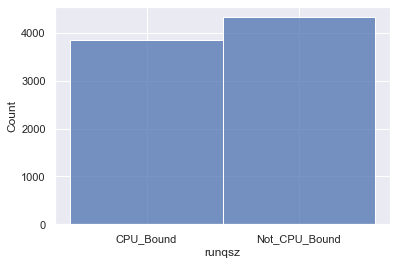

In [28]:
sns.histplot(data1.runqsz)
plt.show()

# Bivariate Analysis

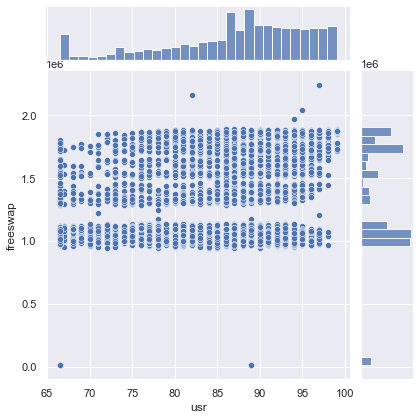

In [29]:
sns.jointplot(data['usr'],data['freeswap']);

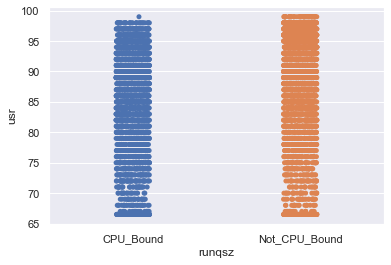

In [30]:
sns.stripplot(data1['runqsz'],data['usr']);

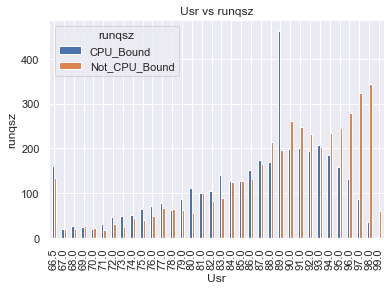

In [31]:
pd.crosstab(data.usr,data1.runqsz).plot(kind='bar')
plt.title('Usr vs runqsz')
plt.xlabel('Usr')
plt.ylabel('runqsz')
plt.show()

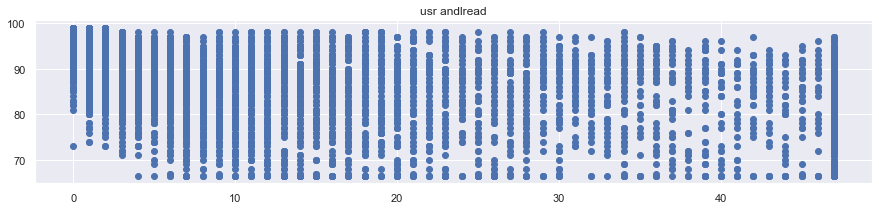

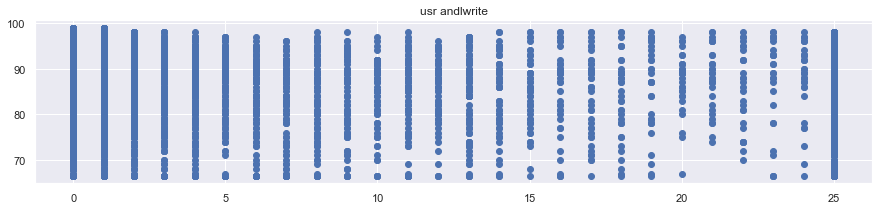

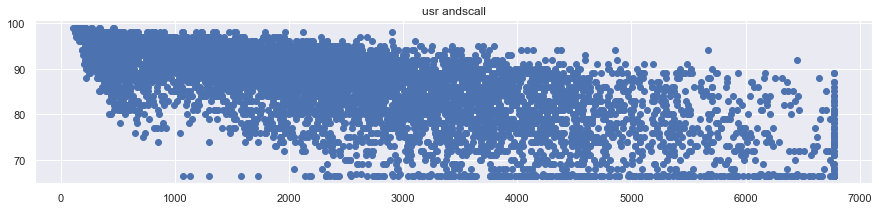

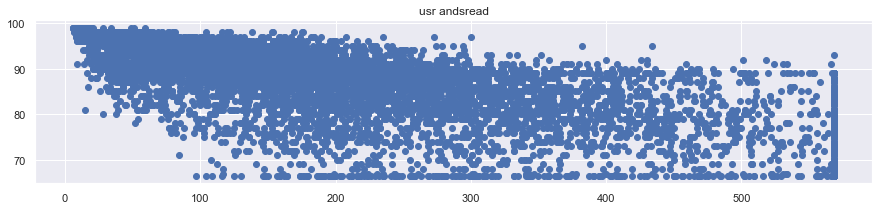

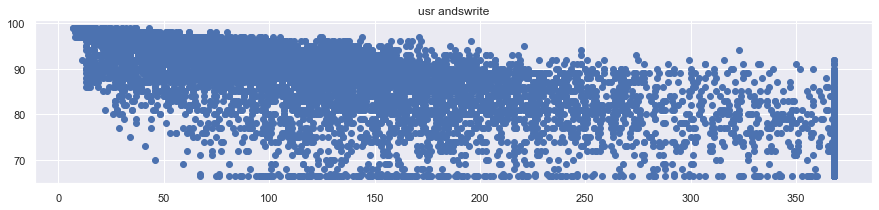

...

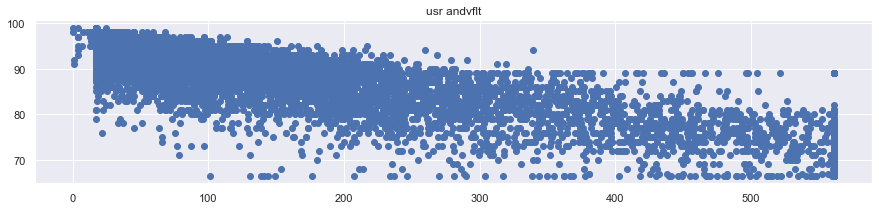

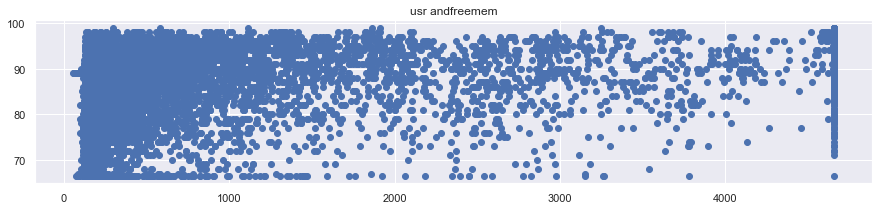

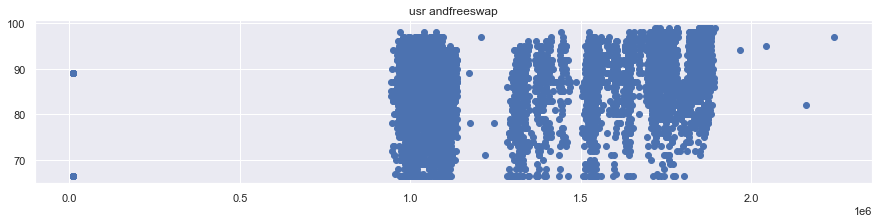

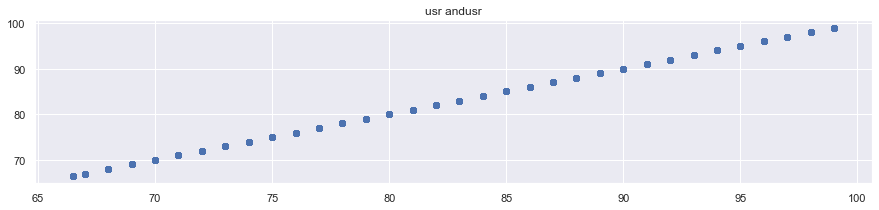

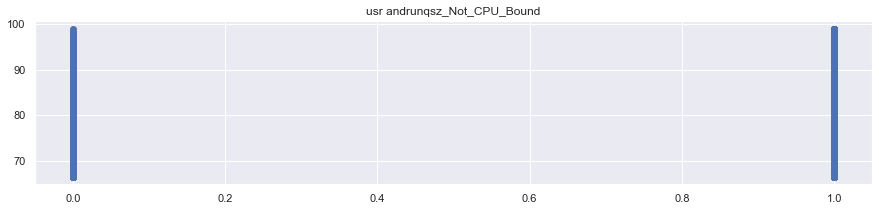

In [32]:
# Lets see the variation of each variable with the usr
for i in data.columns:
    f, (ax1) = plt.subplots(1, 1, sharey=True, figsize =(15,3)) #sharey -> share 'Usr' as y
    ax1.scatter(data[i],data['usr'])
    ax1.set_title('usr and' + i)
    plt.show()

# Standardizing the Numerical Variables

In [33]:
from sklearn.preprocessing import scale
from sklearn.preprocessing import StandardScaler


In [34]:
scaler=StandardScaler()
df1_scaled=scaler.fit_transform(data)


In [35]:
df2=pd.DataFrame(df1_scaled,columns=data.columns)

In [36]:
output=df2['usr']

# Spilt data in Training & Test set (70:30) 

In [37]:
X_train,X_test,y_train,y_test=train_test_split(df2,output,test_size=0.30,random_state=1)#70:30

In [38]:
X=df2.drop(['usr'],axis=1)
y=df2['usr']

In [39]:
X_train,X_test,y_train,y_test=train_test_split(X,y,test_size=0.30,random_state=1)#70:30

In [40]:
X.head()

,lread,lwrite,scall,sread,swrite,fork,exec,rchar,wchar,pgout,...,pgfree,pgscan,atch,pgin,ppgin,pflt,vflt,freemem,freeswap,runqsz_Not_CPU_Bound
0,-0.819513,-0.716521,-0.092583,-0.823008,-0.720331,-0.853341,-0.853740,-0.797353,-0.305121,-0.64583,...,-0.635071,0.0,-0.689780,-0.622761,-0.586048,-0.882744,-0.918365,2.037473,0.956433,-1.059118
1,-0.885482,-0.716521,-1.333640,-1.238681,-1.204189,-0.853341,-0.853740,-1.027877,-0.945234,-0.64583,...,-0.635071,0.0,-0.689780,-0.830987,-0.819018,-0.886387,-0.977262,2.037473,1.284547,0.944182
2,0.104042,-0.393641,-0.083166,-0.277863,-0.195293,0.277935,0.231003,0.100804,-0.614511,-0.64583,...,-0.635071,0.0,1.442029,-0.050138,0.023258,0.438869,0.274345,-0.427003,-0.730310,0.944182
3,-0.885482,-0.716521,-1.339918,-1.279567,-1.255663,-0.853341,-0.853740,0.100804,-0.941235,-0.64583,...,-0.635071,0.0,-0.689780,-0.804959,-0.801097,-0.886683,-0.977446,2.037473,1.271955,0.944182
4,-0.555640,-0.608895,-1.233200,-1.095580,-1.029176,-0.727644,-0.755127,0.100804,-0.891903,-0.64583,...,-0.635071,0.0,-0.689780,-0.700845,-0.711493,-0.668055,-0.787893,-0.469976,1.026087,0.944182


In [41]:
y.head()

0    0.936385
1    1.180536
2   -0.040220
3    1.302612
4    0.326007
Name: usr, dtype: float64

In [42]:
from sklearn.linear_model import LinearRegression
from statsmodels.stats.outliers_influence import variance_inflation_factor

In [43]:
lm=LinearRegression()
lm.fit(X,y)

LinearRegression()

In [44]:
lm.coef_

array([-7.87353147e-02,  3.67339598e-02, -2.64127999e-01,  1.42375921e-02,
       -7.71163130e-02,  2.52170912e-02, -9.92497489e-02, -6.52860705e-02,
       -4.51431246e-02, -6.87745337e-02, -2.09913348e-02,  4.15537839e-02,
       -1.38777878e-17,  2.45298776e-02, -7.07793432e-02, -5.91514045e-02,
       -2.43651005e-01, -2.76773668e-01,  7.50825338e-02, -6.90250408e-02,
       -3.29997218e-02])

In [45]:
lm.intercept_

-3.8487321655071575e-17

In [46]:
X=sm.add_constant(X)


In [47]:
X1=sm.add_constant(X)
olsmod = sm.OLS(y_train, X_train)
olsres = olsmod.fit()

In [48]:
print(olsres.summary())

                                 OLS Regression Results                                
Dep. Variable:                    usr   R-squared (uncentered):                   0.867
Model:                            OLS   Adj. R-squared (uncentered):              0.867
Method:                 Least Squares   F-statistic:                              1868.
Date:                Thu, 19 Jan 2023   Prob (F-statistic):                        0.00
Time:                        23:13:34   Log-Likelihood:                         -2414.1
No. Observations:                5734   AIC:                                      4868.
Df Residuals:                    5714   BIC:                                      5001.
Df Model:                          20                                                  
Covariance Type:            nonrobust                                                  
                           coef    std err          t      P>|t|      [0.025      0.975]
-------------------------------

In [49]:
X.describe()

,const,lread,lwrite,scall,sread,swrite,fork,exec,rchar,wchar,...,pgfree,pgscan,atch,pgin,ppgin,pflt,vflt,freemem,freeswap,runqsz_Not_CPU_Bound
count,8192.0,8.192000e+03,8.192000e+03,8.192000e+03,8.192000e+03,8.192000e+03,8.192000e+03,8.192000e+03,8.192000e+03,8.192000e+03,...,8.192000e+03,8192.0,8.192000e+03,8.192000e+03,8.192000e+03,8.192000e+03,8.192000e+03,8.192000e+03,8.192000e+03,8.192000e+03
mean,1.0,-1.635790e-17,1.182594e-16,-4.025101e-18,5.826231e-17,-6.003770e-18,9.230965e-18,-9.240113e-17,-9.988213e-18,-7.922807e-17,...,9.672439e-17,0.0,-2.078483e-16,-1.074783e-16,2.791346e-16,2.315788e-17,-7.817098e-17,1.083931e-16,-4.941251e-17,2.074079e-16
std,0.0,1.000061e+00,1.000061e+00,1.000061e+00,1.000061e+00,1.000061e+00,1.000061e+00,1.000061e+00,1.000061e+00,1.000061e+00,...,1.000061e+00,0.0,1.000061e+00,1.000061e+00,1.000061e+00,1.000061e+00,1.000061e+00,1.000061e+00,1.000061e+00,1.000061e+00
min,1.0,-8.854815e-01,-7.165214e-01,-1.371933e+00,-1.320452e+00,-1.348317e+00,-9.790389e-01,-9.523530e-01,-1.028852e+00,-1.041890e+00,...,-6.350713e-01,0.0,-6.897803e-01,-8.309868e-01,-8.190176e-01,-1.040313e+00,-1.079608e+00,-8.299516e-01,-3.131333e+00,-1.059118e+00
25%,1.0,-7.535451e-01,-7.165214e-01,-8.050764e-01,-7.753076e-01,-7.718049e-01,-7.276441e-01,-8.537400e-01,-8.306538e-01,-7.404325e-01,...,-6.350713e-01,0.0,-6.897803e-01,-7.529020e-01,-7.652553e-01,-7.941108e-01,-8.014325e-01,-7.203397e-01,-6.794809e-01,-1.059118e+00
50%,1.0,-4.237040e-01,-6.088947e-01,-1.525324e-01,-2.301627e-01,-2.158828e-01,-4.762492e-01,-3.606748e-01,-2.978598e-01,-4.081622e-01,...,-6.350713e-01,0.0,-6.897803e-01,-4.665909e-01,-4.785233e-01,-4.120052e-01,-3.398575e-01,-5.036071e-01,-9.323761e-02,9.441822e-01
75%,1.0,4.338827e-01,3.597453e-01,6.420395e-01,5.398545e-01,4.841673e-01,4.036326e-01,4.282293e-01,4.905739e-01,4.252623e-01,...,3.683321e-01,0.0,3.761243e-01,4.398439e-01,4.175144e-01,5.314413e-01,4.688221e-01,3.827855e-01,9.550871e-01,9.441822e-01
max,1.0,2.215024e+00,1.974145e+00,2.812713e+00,2.512598e+00,2.368126e+00,2.100548e+00,2.351183e+00,2.472416e+00,2.173805e+00,...,1.873437e+00,0.0,1.974981e+00,2.228963e+00,2.191669e+00,2.519770e+00,2.374204e+00,2.037473e+00,2.173861e+00,9.441822e-01


In [50]:
X_train.drop('pgscan',axis=1,inplace=True)

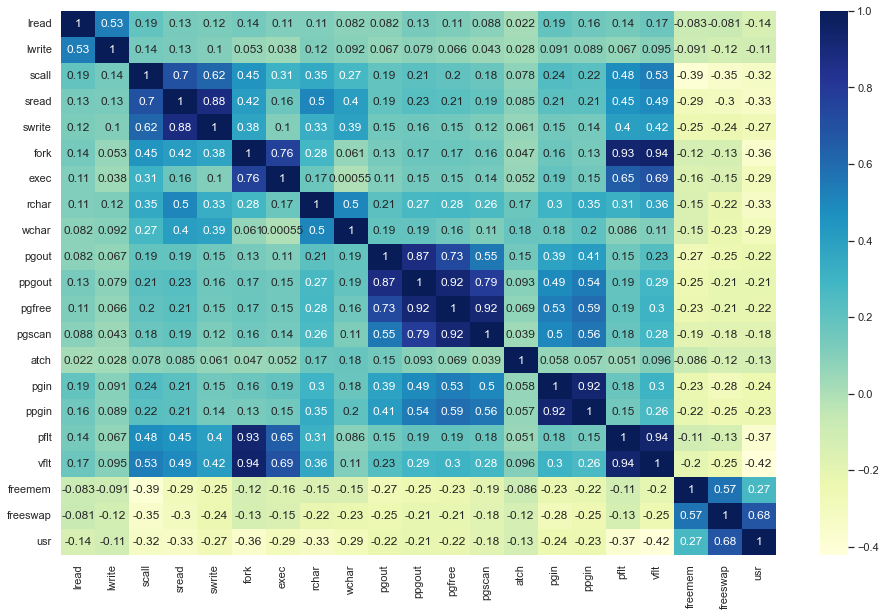

In [51]:
plt.figure(figsize = (16, 10))
sns.heatmap(data1.corr(), annot = True, cmap="YlGnBu")
plt.show()

# Seems usr is highly coorelated with freeswap 

lets build model by taking freeswap

In [52]:
y1_train=df2.pop('usr')
X1_train=X_train

# Building the linear model

In [53]:
X1_train_lm=sm.add_constant(X1_train[['freeswap']])

In [54]:
olsmod1 = sm.OLS(y_train, X1_train_lm)
olsres1 = olsmod1.fit()

In [55]:
olsres1.params

const      -0.003690
freeswap    0.310191
dtype: float64

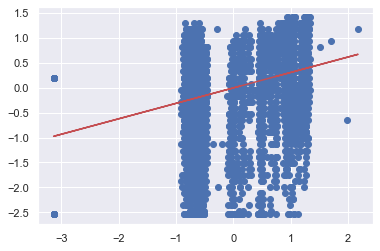

In [56]:
plt.scatter(X1_train_lm.iloc[:, 1], y_train)
plt.plot(X1_train_lm.iloc[:, 1], -0.003690 + 0.310191*X1_train_lm.iloc[:, 1], 'r')
plt.show()

In [57]:
print(olsres1.summary())

                            OLS Regression Results                            
Dep. Variable:                    usr   R-squared:                       0.092
Model:                            OLS   Adj. R-squared:                  0.092
Method:                 Least Squares   F-statistic:                     584.1
Date:                Thu, 19 Jan 2023   Prob (F-statistic):          5.64e-123
Time:                        23:14:03   Log-Likelihood:                -7926.8
No. Observations:                5734   AIC:                         1.586e+04
Df Residuals:                    5732   BIC:                         1.587e+04
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const         -0.0037      0.013     -0.290      0.7

# Add second most highly coorelated value freeman

In [58]:
X2_train_lm=sm.add_constant(X1_train[['freeswap','freemem']])

In [59]:
olsmod2= sm.OLS(y_train,X2_train_lm)

In [60]:
olsres2=olsmod2.fit()

In [61]:
olsres2.params

const      -0.002078
freeswap    0.145016
freemem     0.268509
dtype: float64

In [62]:
print(olsres2.summary())

                            OLS Regression Results                            
Dep. Variable:                    usr   R-squared:                       0.137
Model:                            OLS   Adj. R-squared:                  0.137
Method:                 Least Squares   F-statistic:                     456.4
Date:                Thu, 19 Jan 2023   Prob (F-statistic):          1.15e-184
Time:                        23:14:07   Log-Likelihood:                -7781.3
No. Observations:                5734   AIC:                         1.557e+04
Df Residuals:                    5731   BIC:                         1.559e+04
Df Model:                           2                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const         -0.0021      0.012     -0.167      0.8

# We have clearly improve model as the value of Rsquare went up to 0.13 from 0.09

In [63]:
# Adding all variables 
X_train_lm=sm.add_constant(X1_train)


In [64]:
lr=sm.OLS(y_train,X_train_lm)

In [65]:
lr1=lr.fit()

In [66]:
lr1.params

const                  -0.000702
lread                  -0.081883
lwrite                  0.034733
scall                  -0.264460
sread                   0.004570
swrite                 -0.077756
fork                    0.051802
exec                   -0.109325
rchar                  -0.062412
wchar                  -0.044220
pgout                  -0.055518
ppgout                 -0.040596
pgfree                  0.042601
atch                    0.029995
pgin                   -0.074348
ppgin                  -0.057441
pflt                   -0.260714
vflt                   -0.277928
freemem                 0.073250
freeswap               -0.073074
runqsz_Not_CPU_Bound   -0.038931
dtype: float64

In [67]:
print(lr1.summary())

                            OLS Regression Results                            
Dep. Variable:                    usr   R-squared:                       0.867
Model:                            OLS   Adj. R-squared:                  0.867
Method:                 Least Squares   F-statistic:                     1867.
Date:                Thu, 19 Jan 2023   Prob (F-statistic):               0.00
Time:                        23:14:13   Log-Likelihood:                -2414.1
No. Observations:                5734   AIC:                             4870.
Df Residuals:                    5713   BIC:                             5010.
Df Model:                          20                                         
Covariance Type:            nonrobust                                         
                           coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------------------------------------------------------
const                   -0.0007 

In [68]:
# Create a dataframe that will contain the names of all the feature variables and their respective VIFs
vif=pd.DataFrame()
vif['Features']=X1_train.columns
vif['VIF']=[variance_inflation_factor(X1_train.values,i) for i in range(X1_train.shape[1])]
vif['VIF']=round(vif['VIF'],2)
vif=vif.sort_values(by='VIF',ascending=False)
vif

,Features,VIF
10,ppgout,29.40
11,pgfree,16.50
16,vflt,15.97
14,ppgin,13.95
13,pgin,13.81
5,fork,13.04
15,pflt,12.00
9,pgout,11.36
3,sread,6.42
4,swrite,5.59


# You can See sread has very high p Value we can drop and check again

In [69]:
X2= X1_train.drop('sread',1,)

In [70]:
X3_train_lm=sm.add_constant(X2)

In [71]:
olsmod4= sm.OLS(y_train,X3_train_lm)

In [72]:
lr2=olsmod4.fit()

In [73]:
print(lr2.summary())

                            OLS Regression Results                            
Dep. Variable:                    usr   R-squared:                       0.867
Model:                            OLS   Adj. R-squared:                  0.867
Method:                 Least Squares   F-statistic:                     1966.
Date:                Thu, 19 Jan 2023   Prob (F-statistic):               0.00
Time:                        23:14:16   Log-Likelihood:                -2414.2
No. Observations:                5734   AIC:                             4868.
Df Residuals:                    5714   BIC:                             5001.
Df Model:                          19                                         
Covariance Type:            nonrobust                                         
                           coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------------------------------------------------------
const                   -0.0007 

In [74]:
vif=pd.DataFrame()
vif['features']=X2.columns
vif['VIF']=[variance_inflation_factor(X2.values,i) for i in range(X2.shape[1])]
vif['VIF']=round(vif['VIF'],2)
vif=vif.sort_values(by='VIF',ascending=False)
vif

,features,VIF
9,ppgout,29.40
10,pgfree,16.50
15,vflt,15.85
13,ppgin,13.95
12,pgin,13.81
4,fork,13.00
14,pflt,12.00
8,pgout,11.36
0,lread,5.34
1,lwrite,4.32


In [75]:
for i in lr2.params:
    print(np.exp(i))

0.9992977357174861
0.9212223070944083
1.0355247413262598
0.7683043984469929
0.9277923343206812
1.0528156014049193
0.8963107181385868
0.9405677365224313
0.9565666174593132
0.9460346484841066
0.9602486644763774
1.0435286449775096
1.0303644320075933
0.9282612641612425
0.9441487570204039
0.7705498628403511
0.7578103708264775
1.076039530505509
0.9293695375970822
0.961812186652716


In [76]:
X3= X1_train.drop(['ppgout','sread','pgfree'],1,)
X3_train_lm=sm.add_constant(X3)
olsmod4=sm.OLS(y_train,X3_train_lm)
lr3=olsmod4.fit()
print(lr3.summary())

                            OLS Regression Results                            
Dep. Variable:                    usr   R-squared:                       0.867
Model:                            OLS   Adj. R-squared:                  0.867
Method:                 Least Squares   F-statistic:                     2196.
Date:                Thu, 19 Jan 2023   Prob (F-statistic):               0.00
Time:                        23:14:17   Log-Likelihood:                -2416.5
No. Observations:                5734   AIC:                             4869.
Df Residuals:                    5716   BIC:                             4989.
Df Model:                          17                                         
Covariance Type:            nonrobust                                         
                           coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------------------------------------------------------
const                   -0.0007 

In [77]:
vif=pd.DataFrame()
vif['features']=X3.columns
vif['VIF']=[variance_inflation_factor(X3.values,i) for i in range(X3.shape[1])]
vif['VIF']=round(vif['VIF'],2)
vif=vif.sort_values(by='VIF',ascending=False)
vif

,features,VIF
13,vflt,15.79
11,ppgin,13.77
10,pgin,13.75
4,fork,12.99
12,pflt,11.98
0,lread,5.34
1,lwrite,4.31
5,exec,3.23
3,swrite,3.21
2,scall,2.71
